In [1]:
import os
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt

## Loading audio files with Librosa

In [2]:
blues_file = "data/blues.00000.wav"
classical_file = "data/classical.00000.wav"
country_file = "data/country.00000.wav"
rock_file = "data/rock.00000.wav"

In [3]:
ipd.Audio(blues_file)

In [4]:
ipd.Audio(country_file)

In [5]:
ipd.Audio(rock_file)

In [23]:
# load audio files with librosa
blues, sr = librosa.load(path=blues_file, sr=16000)
country, _ = librosa.load(country_file)
rock, _ = librosa.load(rock_file)
classical, _ = librosa.load(classical_file)

## Extracting Short-Time Fourier Transform

In [8]:
FRAME_SIZE = 2048 #windowsize(how much singal in each window)
HOP_SIZE = 512 #time shift between two consecutive frames

In [9]:
S_blues = librosa.stft(blues, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [10]:
S_blues.shape #frequency bins, time frames

(1025, 1293)

In [11]:
type(S_blues[0][0])

numpy.complex64

## Calculating the spectrogram

In [12]:
Y_scale = np.abs(S_blues) ** 2

In [13]:
Y_scale.shape

(1025, 1293)

In [14]:
type(Y_scale[0][0])

numpy.float32

## Visualizing the spectrogram

In [31]:
S_blues.shape

(1025, 1293)

In [32]:
np.abs(S_blues)[1]

array([ 2.2134793,  1.1041645,  1.3170586, ...,  2.2173395,  4.323704 ,
       10.82242  ], dtype=float32)

In [33]:
# plt.imshow(np.abs(S_blues), cmap='viridis', aspect='auto', origin='lower')
# plt.colorbar()
# plt.show()

In [34]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y, 
                             sr=sr, 
                             hop_length=hop_length, 
                             x_axis="time", 
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f")

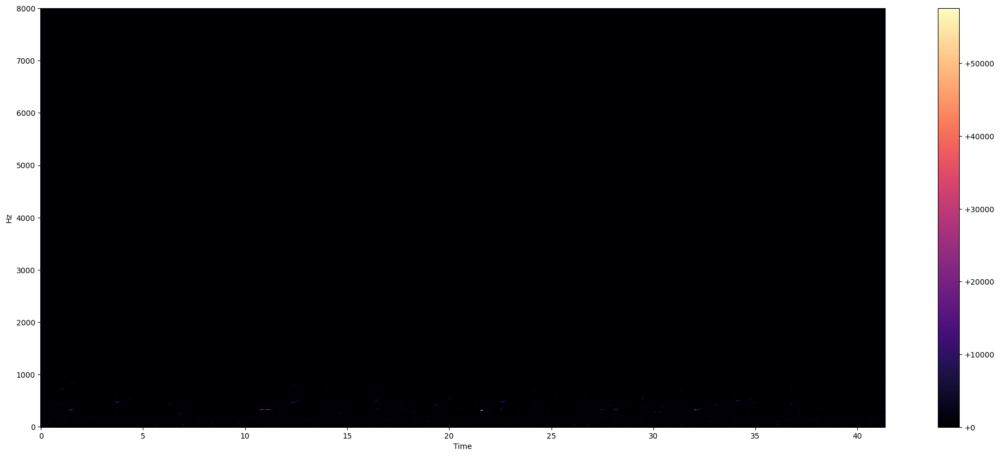

In [35]:
plot_spectrogram(Y_scale, sr, HOP_SIZE)

## Log-Amplitude Spectrogram

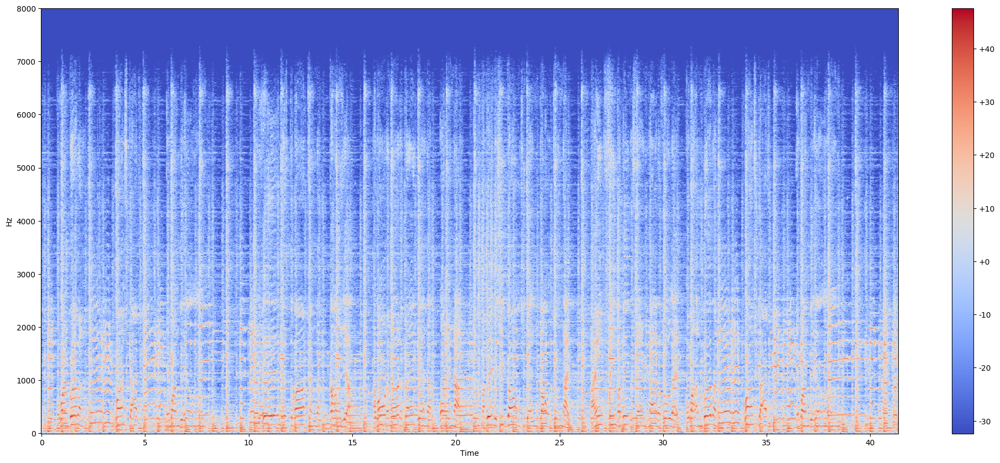

In [36]:
Y_log_scale = librosa.power_to_db(Y_scale)
plot_spectrogram(Y_log_scale, sr, HOP_SIZE)

## Log-Frequency Spectrogram

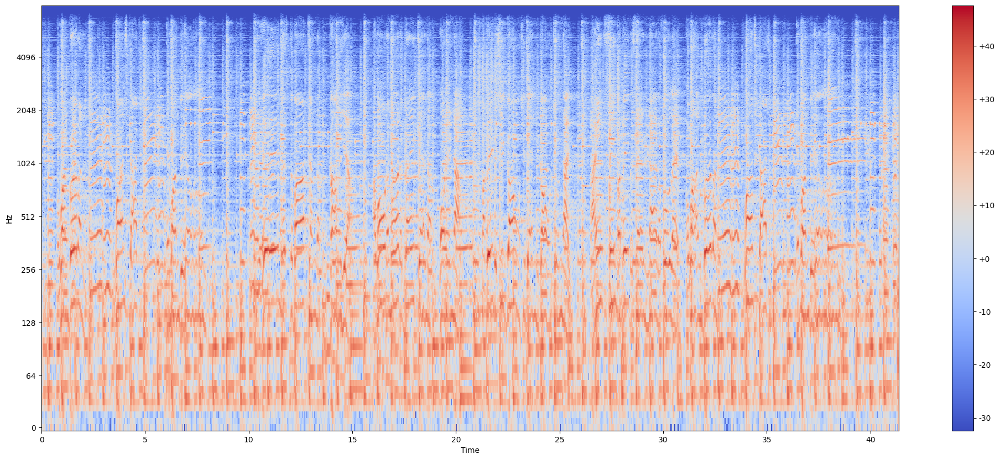

In [37]:
plot_spectrogram(Y_log_scale, sr, HOP_SIZE, y_axis="log")

## Visualising songs from different genres

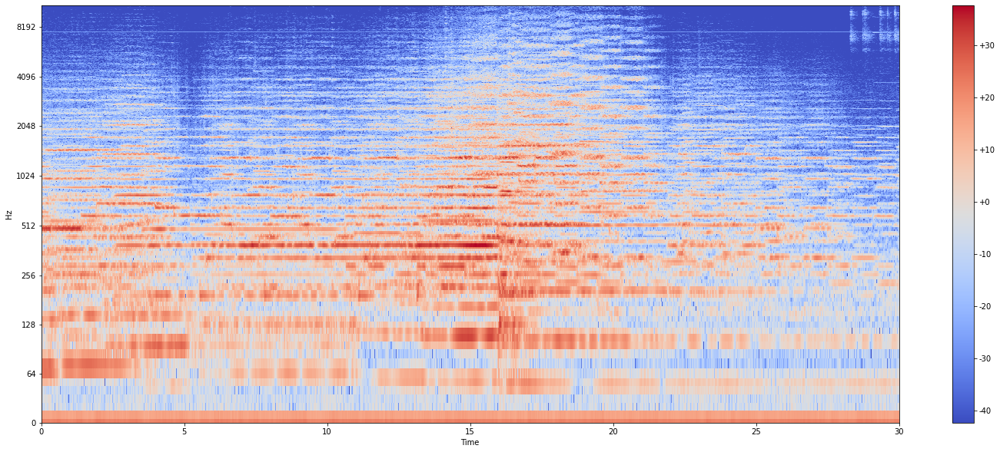

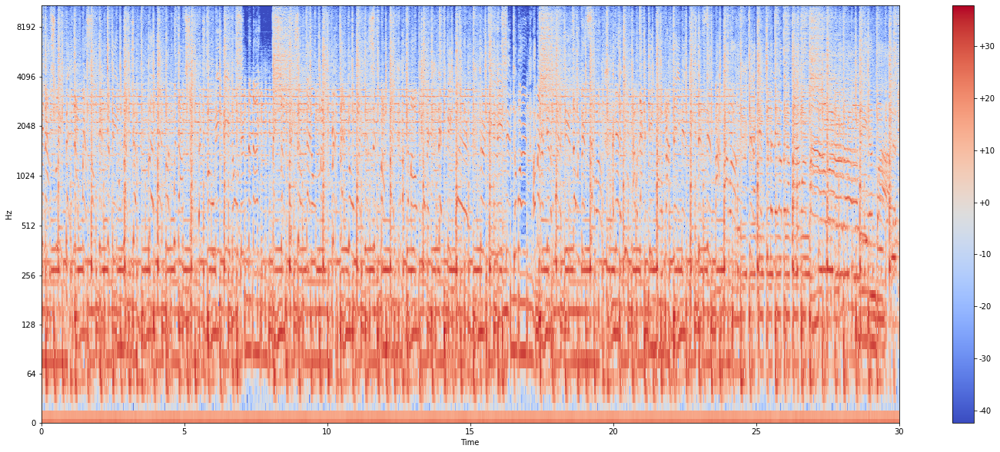

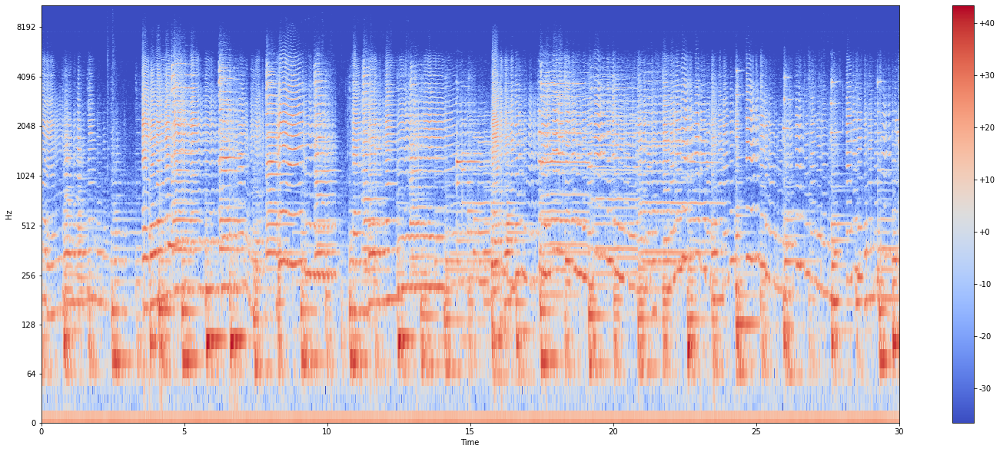

In [23]:
S_debussy = librosa.stft(debussy, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_redhot = librosa.stft(redhot, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_duke = librosa.stft(duke, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)


Y_debussy = librosa.power_to_db(np.abs(S_debussy) ** 2)
Y_redhot = librosa.power_to_db(np.abs(S_redhot) ** 2)
Y_duke = librosa.power_to_db(np.abs(S_duke) ** 2)

plot_spectrogram(Y_debussy, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_redhot, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_duke, sr, HOP_SIZE, y_axis="log")